In [1]:
from scripts.utils import get_dataset
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from torchaudio.transforms import MFCC
import torch
from sklearn.manifold import TSNE
import matplotlib as mpl
from IPython.display import display, Audio
from random import randrange
import numpy as np

In [2]:
plt.style.use("ggplot")

In [3]:
dataset = get_dataset()
dataset

DatasetDict({
    train: Dataset({
        features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
        num_rows: 6112
    })
    test: Dataset({
        features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
        num_rows: 1310
    })
    valid: Dataset({
        features: ['audio', 'slice_file_name', 'fsID', 'start', 'end', 'salience', 'fold', 'classID', 'class'],
        num_rows: 1310
    })
})

Distribution of the labels. Important to know if there is any particular class is present at a higher rate than others.

<AxesSubplot:>

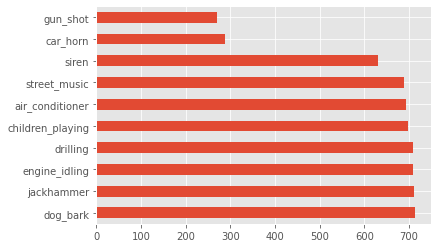

In [4]:
pd.Series(dataset["train"]["class"]).value_counts().plot(kind="barh")

Except for the gun_shot and car_horn classes, labels seem to be equally distributed. Special measures like over or under sampling don't seem necessary

Distribution of duration

<AxesSubplot:>

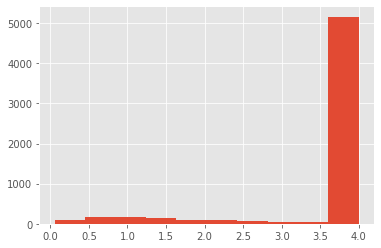

In [5]:
(pd.Series(dataset["train"]["end"]) - pd.Series(dataset["train"]["start"])).hist()

Most clips seem to be around 4s in duration. For the remaining clips, we'll have to use padding

# Samples from all classes

In [6]:
labels = np.array(dataset["train"]["class"])
classes = sorted(list(set(dataset["train"]["class"])))

In [7]:
for x in classes:
    print(x)
    class_subset = dataset["train"].select(np.where(labels == x)[0])
    for _ in range(3):
        sample = class_subset[randrange(0, len(class_subset))]
        display(Audio(sample["audio"]["array"], rate=sample["audio"]["sampling_rate"]))

air_conditioner


car_horn


children_playing


dog_bark


drilling


engine_idling


gun_shot


jackhammer


siren


street_music


All the classes seem distinct enough so shouldn't so the it should be possible to get decent performance on the task.

# Exploring the seperabiliity of the classes
Using a dimensionality reduction technique, such as TSNE, we can get an idea about how separable are the classes with respect to each other

In [8]:
mfcc_transform = MFCC(n_mfcc=40, sample_rate=dataset["train"][0]["audio"]["sampling_rate"])

/Users/snehalranjan/miniconda3/lib/python3.9/site-packages/torchaudio/functional/functional.py:571: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


In [9]:
mfcc_features = [mfcc_transform(torch.tensor(x["audio"]["array"]).float()).mean(-1).numpy() for x in tqdm(dataset["train"])]

  0%|          | 0/6112 [00:00<?, ?it/s]

In [10]:
%%time
tsne = TSNE()
reduced_features = tsne.fit_transform(mfcc_features)
reduced_features.shape

/Users/snehalranjan/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/snehalranjan/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


CPU times: user 59.8 s, sys: 15 s, total: 1min 14s
Wall time: 11.1 s


(6112, 2)

In [11]:
df = pd.DataFrame(zip(*reduced_features.T, dataset["train"]["class"]), columns=["x", "y", "class", ])
print(len(df))
df.head()

6112


,x,y,class
0,68.179482,43.570770,jackhammer
1,-72.325821,12.808189,engine_idling
2,-43.132973,21.062531,children_playing
3,22.583473,30.926529,dog_bark
4,23.375946,-16.912394,air_conditioner


In [12]:
classes = df["class"].sort_values().unique()
classes.shape

(10,)

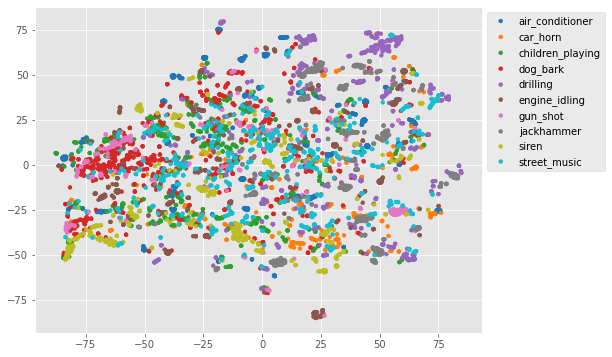

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

for (classId, className) in enumerate(classes): 
    df_class = df[df["class"] == className]
    ax.scatter(
        df_class["x"],
        df_class["y"],
        s=15, 
        c=[mpl.cm.tab10.colors[classId] for _ in range(len(df_class))], 
        label=classes[classId]
    )
    
plt.legend(bbox_to_anchor=(1, 1))

We can see that certain categories like drilling are easily discernable from other labels but classes like street_music are mixed in with others.

Important to note that the features used here (MFCC) might not be able to represent the information in the best way possible.